<a href="https://colab.research.google.com/github/Annie-jain/BlurredFace-LicensePlate-detection/blob/main/ObjectDetectionYolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import json
import cv2
import os
import matplotlib.pyplot as plt
import shutil
import numpy as np

In [ ]:
import logging
logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null

In [ ]:
from pylabel import importer

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.makedirs("dataset", exist_ok=True)

In [ ]:
os.makedirs("dataset/blur_sample_png_ann/yolo_ann", exist_ok=True)

In [ ]:
!unzip -uq "/content/drive/MyDrive/Valeo dataset/blur_sample_png_ann-20230427T101448Z-001.zip" -d "/content/dataset/"

**Plotting all BOUNDING BOX of an image and finding its orientation angle**

{'xp_1': 398, 'yp_1': 391, 'xp_2': 402, 'yp_2': 391, 'xp_3': 402, 'yp_3': 397, 'xp_4': 398, 'yp_4': 397}
Orientation angle: 90.0
[[398 391]
 [402 391]
 [402 397]
 [398 397]]
398 391 398 391
0.0
398 391 398 397
1.5707963267948966
90.0
{'xp_1': 319, 'yp_1': 381, 'xp_2': 323, 'yp_2': 381, 'xp_3': 323, 'yp_3': 388, 'xp_4': 319, 'yp_4': 388}
Orientation angle: 90.0
[[319 381]
 [323 381]
 [323 388]
 [319 388]]
319 381 319 381
0.0
319 381 319 388
1.5707963267948966
90.0
{'xp_1': 420, 'yp_1': 391, 'xp_2': 423, 'yp_2': 391, 'xp_3': 423, 'yp_3': 398, 'xp_4': 420, 'yp_4': 398}
Orientation angle: 90.0
[[420 391]
 [423 391]
 [423 398]
 [420 398]]
420 391 420 391
0.0
420 391 420 398
1.5707963267948966
90.0
{'xp_1': 392, 'yp_1': 389, 'xp_2': 395, 'yp_2': 389, 'xp_3': 395, 'yp_3': 396, 'xp_4': 392, 'yp_4': 396}
Orientation angle: 90.0
[[392 389]
 [395 389]
 [395 396]
 [392 396]]
392 389 392 389
0.0
392 389 392 396
1.5707963267948966
90.0
{'xp_1': 364, 'yp_1': 389, 'xp_2': 369, 'yp_2': 389, 'xp_3': 369

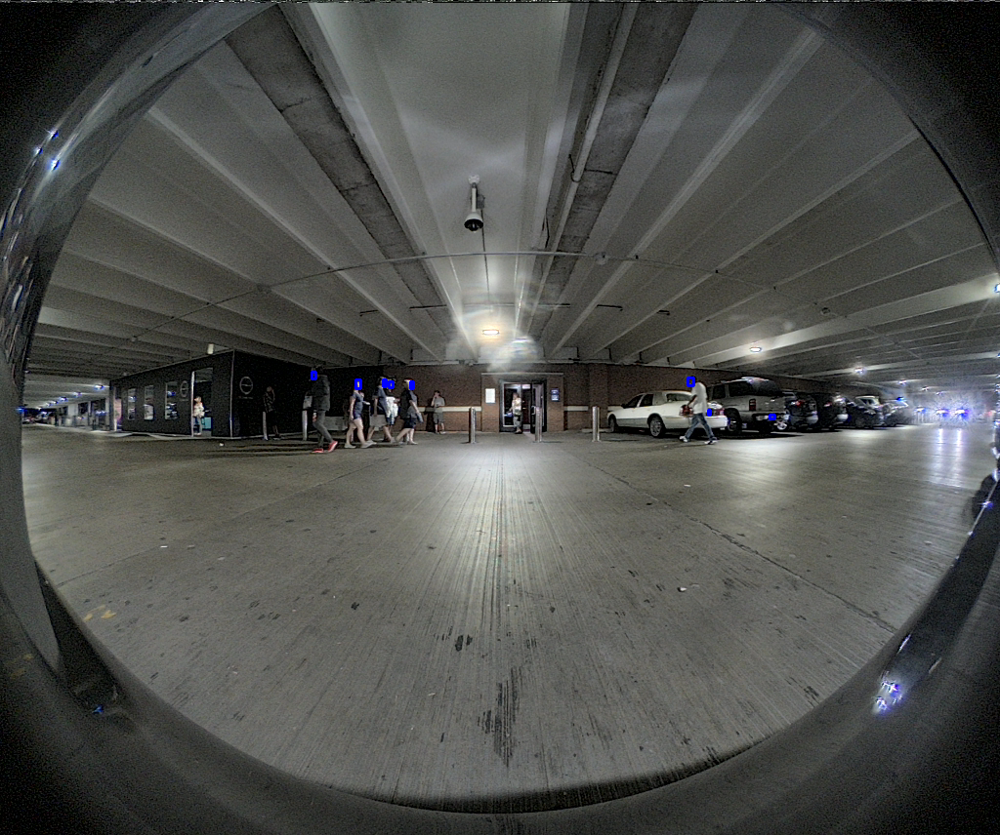

In [ ]:
import json
import cv2
from google.colab.patches import cv2_imshow
import math

image = cv2.imread('/content/dataset/blur_sample_png_ann/pngs/X3-EEG1377.YUV.DAT.20220724.022604_BLURDL_MS_annotation_FV_481.png')
with open('/content/dataset/blur_sample_png_ann/ann/X3-EEG1377.YUV.DAT.20220724.022604_BLURDL_MS_annotation_FV_481.json', 'r') as f:
  data = json.load(f)
  list_len = len(data)
  for i in range(list_len):
    ann = data[i]['geometry']['coordinates']
    print(ann)
    x_min = min(float(ann['xp_1']), float(ann['xp_2']), float(ann['xp_3']), float(ann['xp_4']))
    x_max = max(float(ann['xp_1']), float(ann['xp_2']), float(ann['xp_3']), float(ann['xp_4']))
    y_min = min(float(ann['yp_1']), float(ann['yp_2']), float(ann['yp_3']), float(ann['yp_4']))
    y_max = max(float(ann['yp_1']), float(ann['yp_2']), float(ann['yp_3']), float(ann['yp_4']))
    
    # for bounding box
    TL = (int(x_min), int(y_max))
    BR = (int(x_max), int(y_min))
    color = ( 255,0, 0)
    thickness = 2
    image = cv2.rectangle(image, TL, BR, color, thickness)

    # for orientation angle
    bbox = np.array([(ann['xp_1'], ann['yp_1']), (ann['xp_2'], ann['yp_2']), (ann['xp_3'], ann['yp_3']), (ann['xp_4'], ann['yp_4'])])

    # Convert the bounding box coordinates to a `RotatedRect` object
    rect = cv2.minAreaRect(bbox)

    # Get the angle of the rectangle
    angle = rect[2]

    # Print the angle
    print('Orientation angle:', angle)
    print(bbox)

    x_coords = sorted([vertex[0] for vertex in bbox])
    x1, x2 = x_coords[:2]
    y_coords = sorted([vertex[1] for vertex in bbox])
    y1, y2 = y_coords[:2]
    print(x1,y1,x2,y2)
    op=x2-x1
    adj=y2-y1

    angle= math.atan2(adj,op)
    print(angle)


    #EXACT TWO LEAST COORDINATES

    # Find the index of the 2 least x-coordinate
    x_indices = np.argsort(bbox[:, 0])
    x1_index, x2_index = x_indices[:2]


    # Get the two vertices
    x3, y3 = bbox[x1_index, 0], bbox[x1_index, 1]
    x4, y4 = bbox[x2_index, 0], bbox[x2_index, 1]
    print(x3,y3,x4,y4)
    op=x4-x3
    adj=y4-y3

    angle= math.atan2(adj,op)
    print(angle)

    angle_degrees = math.degrees(angle)

    # Adjust the angle to be in the range of -90 to 90 degrees
    if angle_degrees > 90:
        angle_degrees = -(180 - angle_degrees)
    elif angle_degrees < -90:
        angle_degrees = 180 + angle_degrees
    print(angle_degrees)
cv2_imshow(image)

# **Orientation Angle for all BOUNDING BOX in all the images**

In [ ]:
import json

input_fol ="/content/dataset/blur_sample_png_ann/ann/"
for filename in os.listdir(input_fol):
    if filename.endswith(".json"):
        with open(os.path.join(input_fol, filename), "r") as f:
            data = json.load(f)
        list_len = len(data)
        for i in range(list_len):
          ann = data[i]['geometry']['coordinates']  
        
          x_min = min(float(ann['xp_1']), float(ann['xp_2']), float(ann['xp_3']), float(ann['xp_4']))
          x_max = max(float(ann['xp_1']), float(ann['xp_2']), float(ann['xp_3']), float(ann['xp_4']))
          y_min = min(float(ann['yp_1']), float(ann['yp_2']), float(ann['yp_3']), float(ann['yp_4']))
          y_max = max(float(ann['yp_1']), float(ann['yp_2']), float(ann['yp_3']), float(ann['yp_4']))
          bbox = np.array([(ann['xp_1'], ann['yp_1']), (ann['xp_2'], ann['yp_2']), (ann['xp_3'], ann['yp_3']), (ann['xp_4'], ann['yp_4'])])

  # Convert the bounding box coordinates to a `RotatedRect` object
          rect = cv2.minAreaRect(bbox)

  # Get the angle of the rectangle
          angle = rect[2]

  # Print the angle
          print(i,'Orientation angle:', angle)
          
        print("======")


0 Orientation angle: 90.0
1 Orientation angle: 90.0
0 Orientation angle: -0.0
1 Orientation angle: 90.0
2 Orientation angle: 90.0
3 Orientation angle: 90.0
4 Orientation angle: 90.0
5 Orientation angle: 90.0
6 Orientation angle: 90.0
0 Orientation angle: 90.0
1 Orientation angle: 90.0
2 Orientation angle: 90.0
3 Orientation angle: 90.0
4 Orientation angle: 90.0
5 Orientation angle: 90.0
0 Orientation angle: 90.0
1 Orientation angle: 90.0
2 Orientation angle: 90.0
3 Orientation angle: 90.0
4 Orientation angle: 90.0
0 Orientation angle: 90.0
1 Orientation angle: 90.0
2 Orientation angle: 90.0
3 Orientation angle: 90.0
4 Orientation angle: 90.0
5 Orientation angle: 90.0
0 Orientation angle: 90.0
1 Orientation angle: 90.0
2 Orientation angle: 90.0
3 Orientation angle: 90.0
4 Orientation angle: 90.0
5 Orientation angle: 90.0
6 Orientation angle: 90.0
7 Orientation angle: 90.0
8 Orientation angle: 90.0
9 Orientation angle: 90.0
10 Orientation angle: 90.0
0 Orientation angle: 90.0
1 Orientati

# **JSON TO YOLO FORMAT ANNOTATION**

In [ ]:
import cv2
import os
import json
import math

input_folder = "/content/dataset/blur_sample_png_ann/ann"
output_folder = "/content/dataset/blur_sample_png_ann/pngs"

img = cv2.imread("/content/dataset/blur_sample_png_ann/pngs/7S-LBVS731.YUV.DAT.20200129.092534_MVR_621.png")
height, width, channels = img.shape 
#width = 640  # the width of the video frame in pixels
#height = 480  # the height of the video frame in pixels

for filename in os.listdir(input_folder):
    if filename.endswith(".json"):
        with open(os.path.join(input_folder, filename), "r") as f:
            annotations = json.load(f)
        yolo_annotations = []
        for annotation in annotations:
            if annotation["annotation_type"] == "BlurFace":
                coords = annotation["geometry"]["coordinates"]
                x1 = coords["xp_1"] / width
                y1 = coords["yp_1"] / height
                x2 = coords["xp_3"] / width
                y2 = coords["yp_3"] / height
                xc = (x1 + x2) / 2
                yc = (y1 + y2) / 2
                w = x2 - x1
                h = y2 - y1
        
                yolo_annotations.append([0, xc, yc, w, h])  # append YOLO format annotation
            elif annotation["annotation_type"] == "BlurLicencePlate":
                coords = annotation["geometry"]["coordinates"]
                x1 = coords["xp_1"] / width
                y1 = coords["yp_1"] / height
                x2 = coords["xp_3"] / width
                y2 = coords["yp_3"] / height
                xc = (x1 + x2) / 2
                yc = (y1 + y2) / 2
                w = x2 - x1
                h = y2 - y1
                
                #orientation angle using atan(adjacent coordinates)
                #image_cy = height/2
                #image_cx= width/2
                #b_y = (y1+y2)/2
                #b_x=(x1+x2)/2
                #angle = math.atan2(b_y - image_cy, b_x - image_cx)
                #angle_degrees = math.degrees(angle)
                #print(angle_degrees)

                yolo_annotations.append([1, xc, yc, w, h])
        with open(os.path.join(output_folder, os.path.splitext(filename)[0] + ".txt"), "w") as f:
            for annotation in yolo_annotations:
                f.write(" ".join(str(coord) for coord in annotation) + "\n")

# **IMPLEMENTING YOLOv5 ON CUSTOM DATASET**

In [ ]:
!pip install tensorflow
import torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from IPython.display import Image

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone


Cloning into 'yolov5'...
remote: Enumerating objects: 15637, done.
remote: Counting objects: 100% (244/244), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 15637 (delta 123), reused 169 (delta 97), pack-reused 15393
Receiving objects: 100% (15637/15637), 14.64 MiB | 19.55 MiB/s, done.
Resolving deltas: 100% (10651/10651), done.


In [ ]:
%cd yolov5


/content/yolov5


In [ ]:
!pip install -r requirements.txt  # install

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00


In [ ]:
import os
os.makedirs("/content/yolov5/dataset", exist_ok=True)

In [ ]:

os.makedirs("/content/yolov5/dataset/images", exist_ok=True)
os.makedirs("/content/yolov5/dataset/labels", exist_ok=True)

In [ ]:
!mkdir "/content/yolov5/dataset/images/train"
!mkdir "/content/yolov5/dataset/images/valid"

!mkdir "/content/yolov5/dataset/labels/train"
!mkdir "/content/yolov5/dataset/labels/valid"

In [ ]:
from random import choice
import shutil

imgs=[]
annot=[]

trainPath = '/content/yolov5/dataset/images/train/'
valPath = '/content/yolov5/dataset/images/valid/'
crsPath = '/content/dataset/blur_sample_png_ann/pngs'

#split ratio
train_ratio = 0.8
valid_ratio = 0.2

totalImages = len(os.listdir(crsPath))/2

#FILE STORE IN LIST
for(dirname, dirs, files) in os.walk(crsPath):
  for filename in files:
    if filename.endswith('.txt'):
      annot.append(filename)
    else:
      imgs.append(filename)

#COUNT TRAIN VALID IMGS

train_count =int(len(imgs) * train_ratio)
valid_count =int(len(imgs) * valid_ratio)
print("no. of training imgs: ", train_count)
print("no. of validation imgs: ", valid_count)

no. of training imgs:  79
no. of validation imgs:  19


In [ ]:
trainimagePath = '/content/yolov5/dataset/images/train'
trainlabelPath = '/content/yolov5/dataset/labels/train'
validimagePath = '/content/yolov5/dataset/images/valid'
validlabelPath = '/content/yolov5/dataset/labels/valid'

for i in range(train_count):
  fileimg = choice(imgs)
  fileannot = fileimg[:-4] + '.txt'

  shutil.copy(os.path.join(crsPath,fileimg),os.path.join(trainimagePath,fileimg))
  shutil.copy(os.path.join(crsPath,fileannot), os.path.join(trainlabelPath,fileannot))

  imgs.remove(fileimg)
  annot.remove(fileannot)

for i in range(valid_count):
  fileimg = choice(imgs)
  fileannot = fileimg[:-4] + '.txt'

  shutil.copy(os.path.join(crsPath,fileimg),os.path.join(validimagePath,fileimg))
  shutil.copy(os.path.join(crsPath,fileannot), os.path.join(validlabelPath,fileannot))

  imgs.remove(fileimg)
  annot.remove(fileannot)

shutil.move (crsPath,valPath)

'/content/yolov5/dataset/images/valid/pngs'

In [ ]:
import os



# Get the names of the image files in the training and validation directories
train_files = os.listdir(trainPath)
val_files = os.listdir(valPath)

# Define the classes in the dataset
classes = ["BlurFace","BlurLicencePlate"]

# Write the dataset.yaml file
with open("dataset.yaml", "w") as f:
    f.write("train: {}\n".format(trainPath))
    f.write("val: {}\n".format(valPath))
    f.write("\n")
    f.write("nc: {}\n".format(len(classes)))
    f.write("names: {}\n".format(classes))

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!python train.py --img 415 --batch 16 --epochs 30 --data dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, 

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 3493), started 0:46:58 ago. (Use '!kill 3493' to kill it.)

<IPython.core.display.Javascript object>

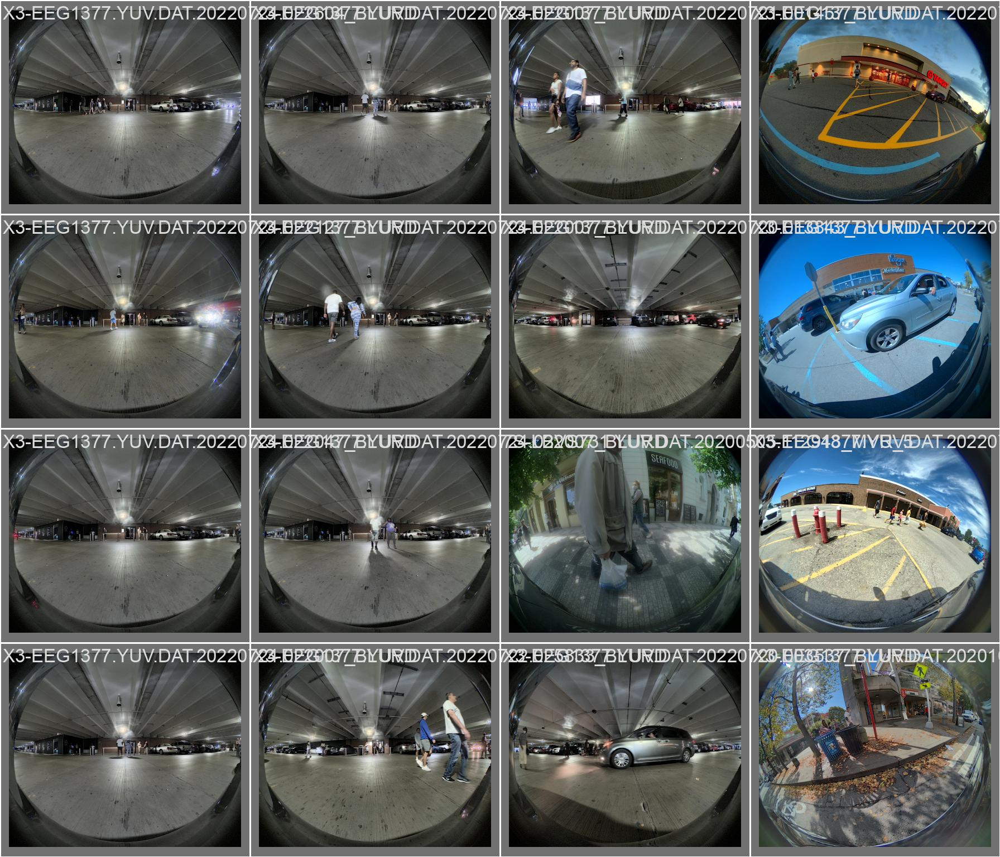

In [ ]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch1_pred.jpg', width=1000)

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!python detect.py --source /content/yolov5/runs/train/exp/7S-LBVS731.YUV.DAT.20200504.131650_MVR_451.png --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.25 

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/runs/train/exp/7S-LBVS731.YUV.DAT.20200504.131650_MVR_451.png, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/runs/train/exp/7S-LBVS731.YUV.DAT.20200504.131650_MVR_451.png: 352x416 (no detections), 40.1ms
Speed: 0.4ms pre-process, 40.1ms inference, 0.5ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp5
